# Final Project Prototype

For this project, the code from the official Pytorch documentation was used and adapted. The original code can be accessed via https://docs.pytorch.org/tutorials/advanced/neural_style_tutorial.html

The codes below showcase the libraries and their respective versions that were used for this project:

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights, vgg16, VGG16_Weights

import copy
import time

In [34]:
import sys
import torchvision
import PIL
import IPython
import matplotlib

print("Python: ", sys.version)
print("Torch: ", torch.__version__)
print("Torchvision: ", torchvision.__version__)
print("Pillow: ", PIL.__version__)
print("IPython: ", IPython.__version__)
print("Matplotlib: ", matplotlib.__version__)

Python:  3.11.15 | packaged by Anaconda, Inc. | (main, Mar 11 2026, 17:12:15) [MSC v.1942 64 bit (AMD64)]
Torch:  2.0.1+cu118
Torchvision:  0.15.2+cu118
Pillow:  12.1.1
IPython:  9.13.0
Matplotlib:  3.10.9


The following code checks whether cuda is available, using the system's GPU instead of the CPU:

In [35]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(torch.cuda.is_available())
print(torch.cuda.get_device_name())

torch.set_default_device(device)
print("Using device: ", device)

True
NVIDIA GeForce GTX 1080
Using device:  cuda


This code resizes the input images to be the same dimensions depending on whether cuda is available:

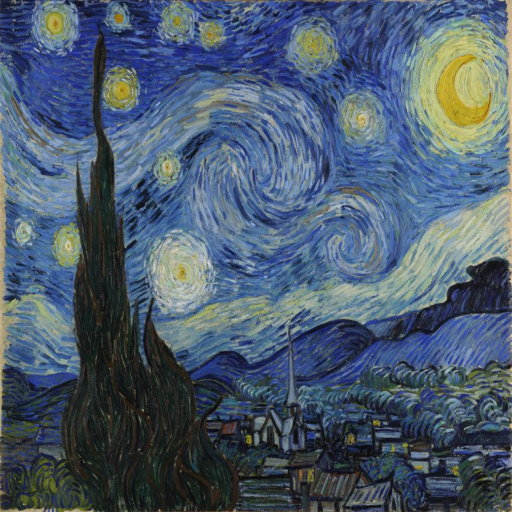

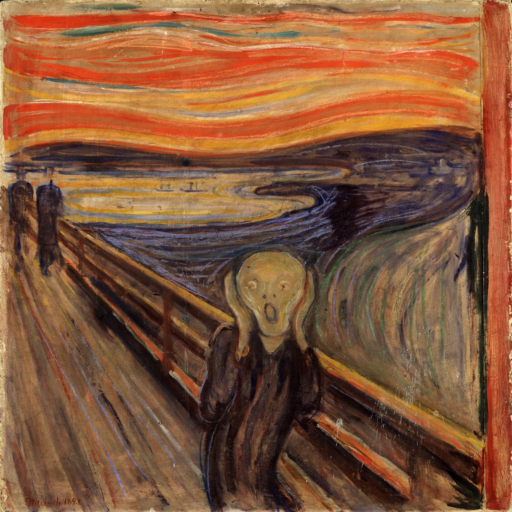

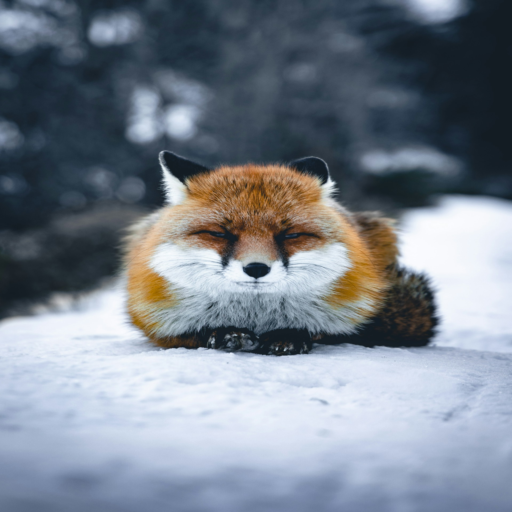

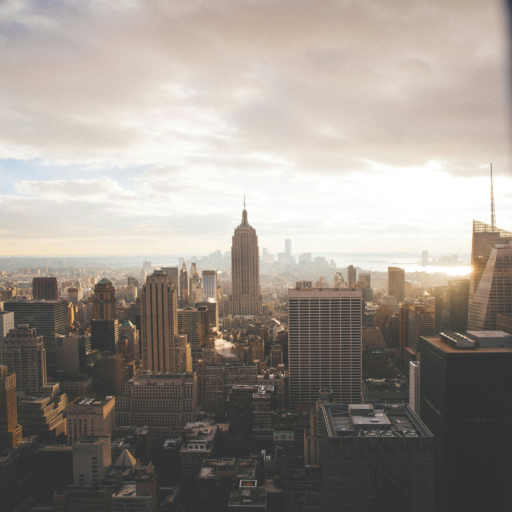

In [36]:
if torch.cuda.is_available():
    img_size = 512

else:
    img_size = 128

loader = transforms.Compose([transforms.Resize((img_size, img_size)), transforms.ToTensor()])

def image_loader(input_image):
    image = Image.open(input_image)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

def display_image(tensor, title="None"):
    tensor = tensor.cpu().clone().squeeze(0)
    image = transforms.ToPILImage()(tensor)
    display(image)

style_paths = ["./style1.jpg", "./style2.jpg"]
content_paths = ["./content1.jpg", "./content2.jpg"]

style_image = [image_loader(s) for s in style_paths]
content_image = [image_loader(c) for c in content_paths]


for i in style_image:
    display_image(i)

for i in content_image:
    display_image(i)

To follow the original configurations by Gatys et al. (2016), a white noise image will be generated to be used as the input image. As these images are randomized when done with torch, a seed will be used to ensure a fair comparison and reproducible code:

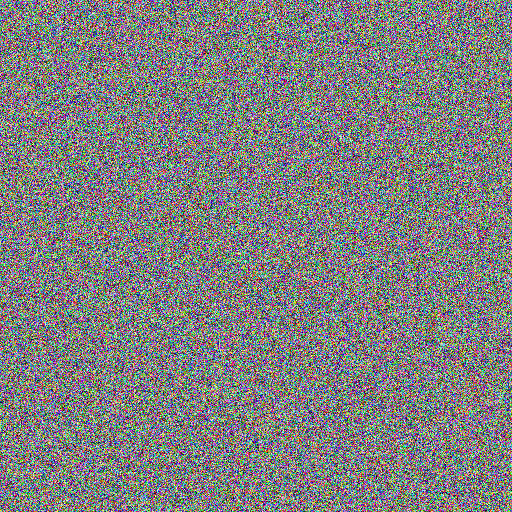

In [18]:
random_seed = 13
torch.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)

white_noise = torch.randn(style_image[0].data.size())

display_image(white_noise)

The loss functions and gram matrix are now initialized, alongside the normalization of the VGG model:

In [19]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

def gram_matrix(input):
    a, b, c, d = input.size()

    features = input.view(a * b, c * d)

    G = torch.mm(features, features.t())

    return G.div(a * b * c * d)

class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

The code below defines function for the main optimization based comparisons:

In [24]:
def vgg_model(model_name = "vgg19"):
    if model_name == "vgg19":
        model = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()
        content_layers = ["conv_10"]
        style_layers = ["conv_1", "conv_3", "conv_5", "conv_9", "conv_13"]
    elif model_name == "vgg16":
        model = vgg16(weights=VGG16_Weights.DEFAULT).features.eval()
        content_layers = ["conv_9"]
        style_layers = ["conv_1", "conv_3", "conv_5", "conv_8", "conv_11"]
    else:
        raise Exception("Invalid Model")
    return model, content_layers, style_layers

def vgg_optimizer(input_image, optimizer_name = "lbfgs"):
    if optimizer_name == "lbfgs":
        optimizer = optim.LBFGS([input_image])
    elif optimizer_name == "adam":
        optimizer = optim.Adam([input_image])
    else:
        raise Exception("Invalid Optimizer")
    return optimizer

In [25]:
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               content_image, style_image, content_layers, style_layers):

    normalization = Normalization(normalization_mean, normalization_std)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0 
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_image).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_image).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

In [26]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_image, style_image, input_image, content_layers, style_layers, 
                       num_steps=300, style_weight=1000000, content_weight=1, optimizer_name="lbfgs"):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, content_image, style_image, content_layers, style_layers)

    input_image.requires_grad_(True)
    model.eval()
    model.requires_grad_(False)

    optimizer = vgg_optimizer(input_image, optimizer_name)


    print('Optimizing..')
    run = [0]
    metrics = {"step": [], "style": [], "content": [], "total": []}
    while run[0] <= num_steps:

        def closure():
            
            with torch.no_grad():
                input_image.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_image)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            metrics["step"].append(run[0])
            metrics["style"].append(style_score.item())
            metrics["content"].append(content_score.item())
            metrics["total"].append(loss.item())
            
            if run[0] % 100 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score
        
        optimizer.step(closure)

    with torch.no_grad():
        input_image.clamp_(0, 1)

    return input_image, metrics

# Baseline (VGG19 + L-BFGS)

First, we run the model with default settings to mimic Gatys et al. (2016). This uses the white noise image as the input, the vgg19 model and the L-BFGS optimizer:

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 32.652584 Content Loss: 35.271969

run [200]:
Style Loss : 14.735694 Content Loss: 24.913330

run [300]:
Style Loss : 9.277366 Content Loss: 21.116854

run [400]:
Style Loss : 7.522593 Content Loss: 19.301222

run [500]:
Style Loss : 6.840978 Content Loss: 18.255085

run [600]:
Style Loss : 6.461123 Content Loss: 17.597569

run [700]:
Style Loss : 6.219746 Content Loss: 17.154076

run [800]:
Style Loss : 6.061248 Content Loss: 16.820436

run [900]:
Style Loss : 5.946090 Content Loss: 16.575802

run [1000]:
Style Loss : 5.851900 Content Loss: 16.388525

Total Runtime (Seconds):  112.79256987571716
Maximum Memory (GB):  1.433485984802246


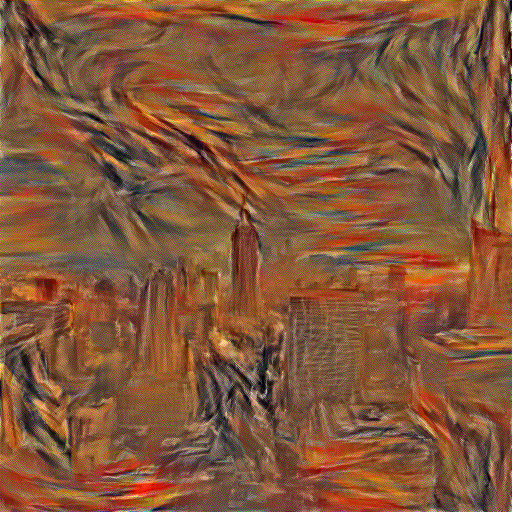

In [28]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

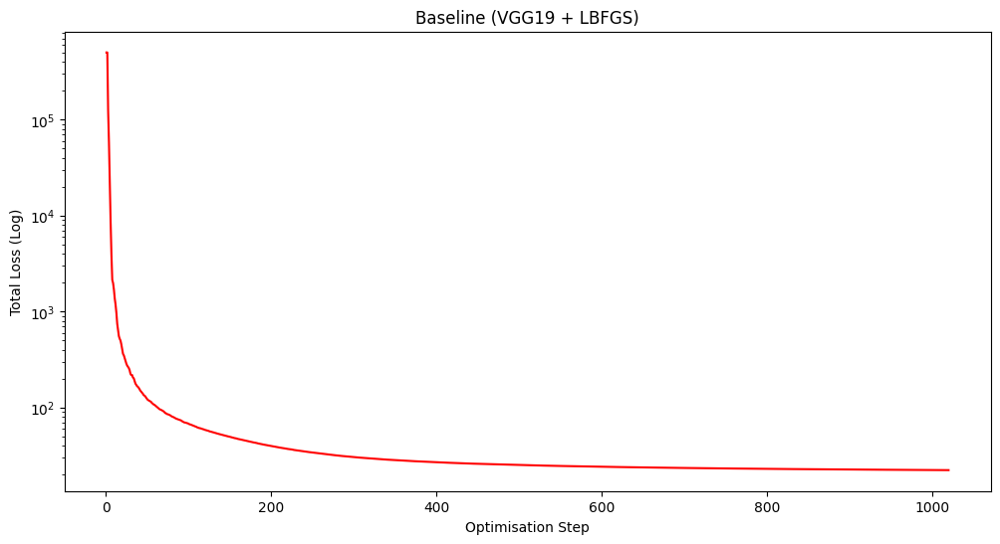

In [32]:
plt.figure(figsize=(12, 6))

plt.plot(metrics["step"], metrics["total"], label="Total Loss", color="red")
plt.yscale("log")
plt.xlabel("Optimisation Step")
plt.ylabel("Total Loss (Log)")
plt.title("Baseline (VGG19 + LBFGS)")
plt.show()

# Architecture Comparison (VGG16 + LBFGS)

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 25.933655 Content Loss: 34.150242

run [200]:
Style Loss : 11.927634 Content Loss: 23.499229

run [300]:
Style Loss : 8.388545 Content Loss: 19.576811

run [400]:
Style Loss : 7.130692 Content Loss: 17.741444

run [500]:
Style Loss : 6.534095 Content Loss: 16.693861

run [600]:
Style Loss : 6.183160 Content Loss: 16.045067

run [700]:
Style Loss : 5.955269 Content Loss: 15.596324

run [800]:
Style Loss : 5.791283 Content Loss: 15.264276

run [900]:
Style Loss : 5.665492 Content Loss: 15.011310

run [1000]:
Style Loss : 5.562546 Content Loss: 14.818996

Total Runtime (Seconds):  98.76199674606323
Maximum Memory (GB):  1.2289857864379883


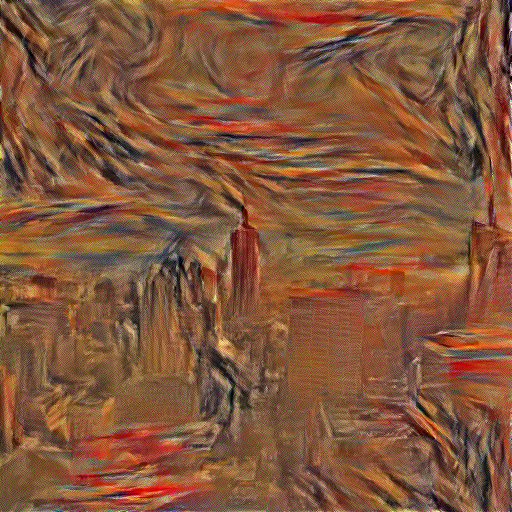

In [39]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg16")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output_16, metrics_16 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime_16 = time_end - time_start
print("Total Runtime (Seconds): ", runtime_16)

if torch.cuda.is_available():
    peak_memory_16 = torch.cuda.max_memory_allocated()
    peak_memory_16 = peak_memory_16/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory_16)

display_image(output_16)

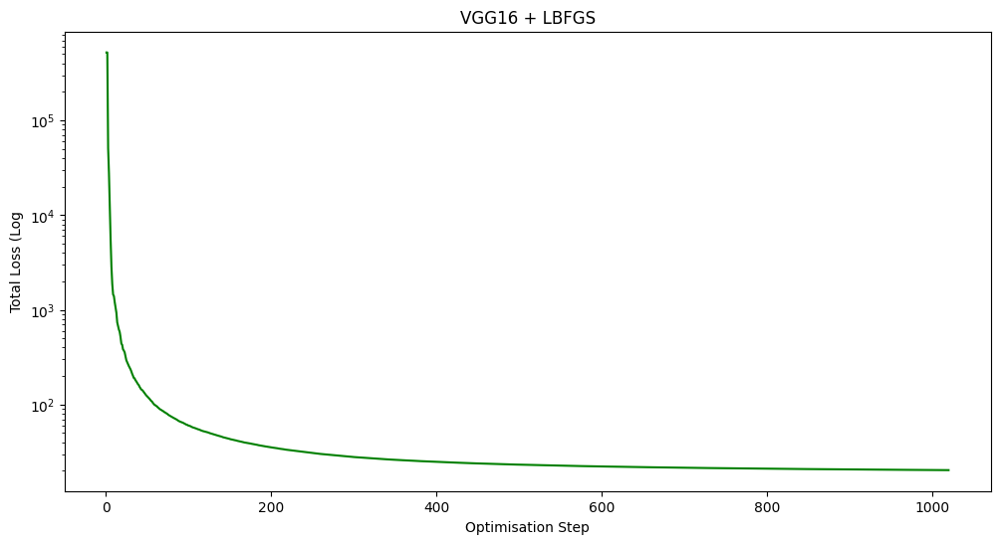

In [40]:
plt.figure(figsize=(12, 6))

plt.plot(metrics_16["step"], metrics_16["total"], label="Total Loss", color="green")
plt.yscale("log")
plt.xlabel("Optimisation Step")
plt.ylabel("Total Loss (Log)")
plt.title("VGG16 + LBFGS")
plt.show()

# Optimizer Comparison (VGG19 + Adam)

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 207.571503 Content Loss: 60.513004

run [200]:
Style Loss : 82.626411 Content Loss: 47.716488

run [300]:
Style Loss : 52.453316 Content Loss: 41.084595

run [400]:
Style Loss : 39.495018 Content Loss: 36.691490

run [500]:
Style Loss : 32.312328 Content Loss: 33.606991

run [600]:
Style Loss : 27.674440 Content Loss: 31.342190

run [700]:
Style Loss : 24.371149 Content Loss: 29.571922

run [800]:
Style Loss : 21.873669 Content Loss: 28.133337

run [900]:
Style Loss : 19.915390 Content Loss: 26.911526

run [1000]:
Style Loss : 18.292807 Content Loss: 25.977758

Total Runtime (Seconds):  82.35901284217834
Maximum Memory (GB):  0.9945068359375


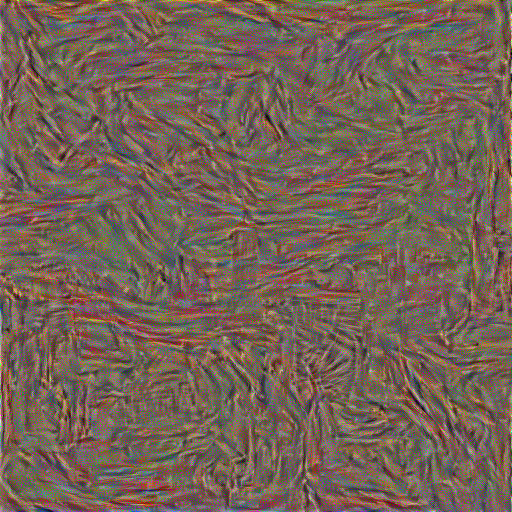

In [44]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output_adam, metrics_adam = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="adam")

time_end = time.time()
runtime_adam = time_end - time_start
print("Total Runtime (Seconds): ", runtime_adam)

if torch.cuda.is_available():
    peak_memory_adam = torch.cuda.max_memory_allocated()
    peak_memory_adam = peak_memory_adam/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory_adam)

display_image(output_adam)

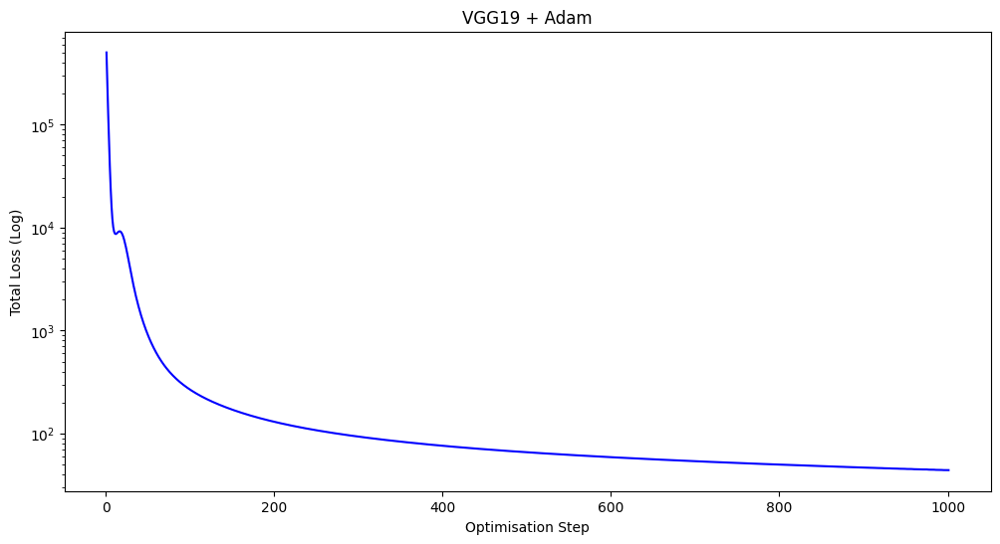

In [51]:
plt.figure(figsize=(12, 6))

plt.plot(metrics_adam["step"], metrics_adam["total"], label="Total Loss", color="blue")
plt.yscale("log")
plt.xlabel("Optimisation Step")
plt.ylabel("Total Loss (Log)")
plt.title("VGG19 + Adam")
plt.show()

# Hyperparameter Analysis

## Changing the Content/Style Ratio

### $10^{-3}$

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 2.957235 Content Loss: 2.764199

run [200]:
Style Loss : 2.212746 Content Loss: 2.005302

run [300]:
Style Loss : 1.966250 Content Loss: 1.740188

run [400]:
Style Loss : 1.832641 Content Loss: 1.606533

run [500]:
Style Loss : 1.746477 Content Loss: 1.523646

run [600]:
Style Loss : 1.684875 Content Loss: 1.468833

run [700]:
Style Loss : 1.638782 Content Loss: 1.429103

run [800]:
Style Loss : 1.604010 Content Loss: 1.409005

run [900]:
Style Loss : 1.577041 Content Loss: 1.370765

run [1000]:
Style Loss : 1.555218 Content Loss: 1.349880

Total Runtime (Seconds):  110.84199953079224
Maximum Memory (GB):  1.3007678985595703


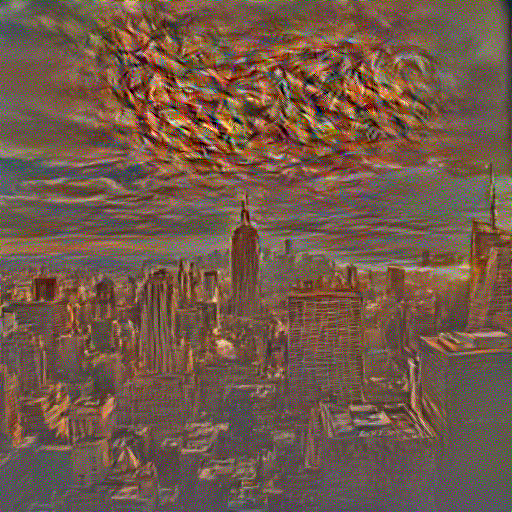

In [66]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=1000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

### $10^{-7}$

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 2379.647705 Content Loss: 94.369400

run [200]:
Style Loss : 720.876831 Content Loss: 89.337708

run [300]:
Style Loss : 284.707214 Content Loss: 84.435104

run [400]:
Style Loss : 156.511719 Content Loss: 79.555443

run [500]:
Style Loss : 105.850723 Content Loss: 75.382866

run [600]:
Style Loss : 79.493279 Content Loss: 71.917244

run [700]:
Style Loss : 63.681324 Content Loss: 69.271919

run [800]:
Style Loss : 53.010475 Content Loss: 67.167236

run [900]:
Style Loss : 45.405334 Content Loss: 65.279167

run [1000]:
Style Loss : 40.034870 Content Loss: 63.789574

Total Runtime (Seconds):  112.12500047683716
Maximum Memory (GB):  1.3052845001220703


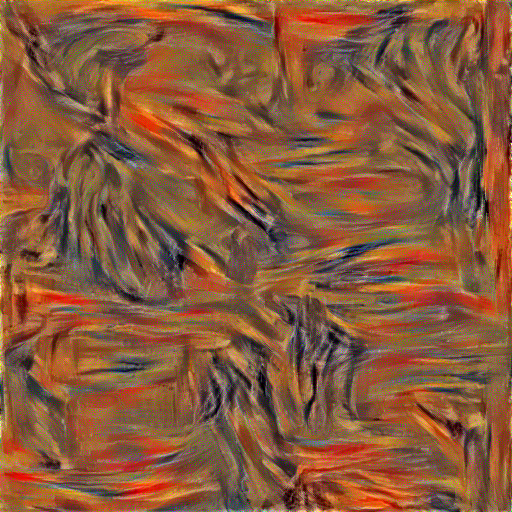

In [68]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=10000000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

## Changing the Number of Iterations 

### 500

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 32.842873 Content Loss: 35.352776

run [200]:
Style Loss : 14.787475 Content Loss: 24.885469

run [300]:
Style Loss : 9.271851 Content Loss: 21.202301

run [400]:
Style Loss : 7.531400 Content Loss: 19.244680

run [500]:
Style Loss : 6.825364 Content Loss: 18.161726

Total Runtime (Seconds):  57.6634840965271
Maximum Memory (GB):  1.434706687927246


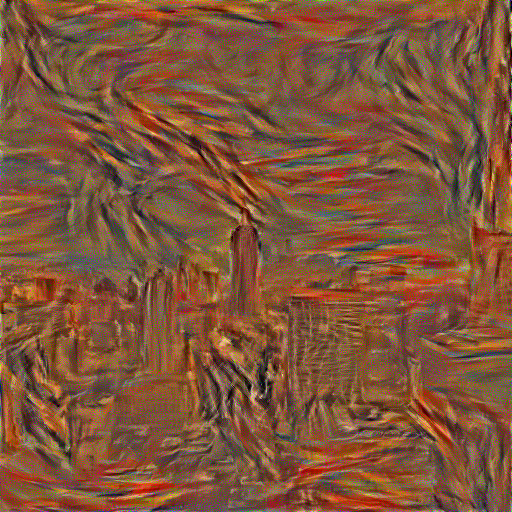

In [38]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=500, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

### 1500

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 32.697140 Content Loss: 35.460533

run [200]:
Style Loss : 14.984529 Content Loss: 24.973499

run [300]:
Style Loss : 9.303075 Content Loss: 21.167740

run [400]:
Style Loss : 7.534793 Content Loss: 19.215546

run [500]:
Style Loss : 6.825232 Content Loss: 18.166172

run [600]:
Style Loss : 6.433908 Content Loss: 17.540173

run [700]:
Style Loss : 6.203146 Content Loss: 17.085949

run [800]:
Style Loss : 6.047076 Content Loss: 16.755068

run [900]:
Style Loss : 5.933681 Content Loss: 16.511002

run [1000]:
Style Loss : 5.845486 Content Loss: 16.328711

run [1100]:
Style Loss : 5.774915 Content Loss: 16.179132

run [1200]:
Style Loss : 5.710461 Content Loss: 16.062811

run [1300]:
Style Loss : 5.663372 Content Loss: 15.963391

run [1400]:
Style Loss : 5.619739 Content Loss: 15.881699

run [1500]:
Style Loss : 5.585348 Content Loss: 15.808909

Total Runtime (Seconds):  165.11197566986084
Maximum Memory (GB):  1.3101

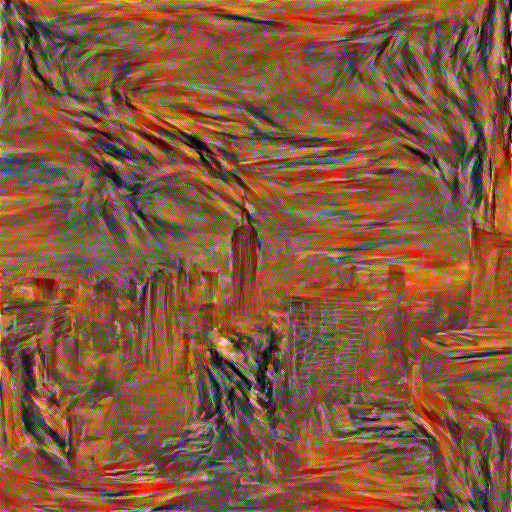

In [70]:
input_image = white_noise.clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1500, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

## Changing the Input 

### LBFGS

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 23.381010 Content Loss: 20.734221

run [200]:
Style Loss : 13.798161 Content Loss: 17.640530

run [300]:
Style Loss : 10.618150 Content Loss: 16.241840

run [400]:
Style Loss : 9.278687 Content Loss: 15.507874

run [500]:
Style Loss : 8.289331 Content Loss: 15.060848

run [600]:
Style Loss : 7.430044 Content Loss: 14.725438

run [700]:
Style Loss : 6.723133 Content Loss: 14.463303

run [800]:
Style Loss : 6.218338 Content Loss: 14.258457

run [900]:
Style Loss : 5.863472 Content Loss: 14.094402

run [1000]:
Style Loss : 5.634573 Content Loss: 13.968732

Total Runtime (Seconds):  111.42698884010315
Maximum Memory (GB):  1.2961292266845703


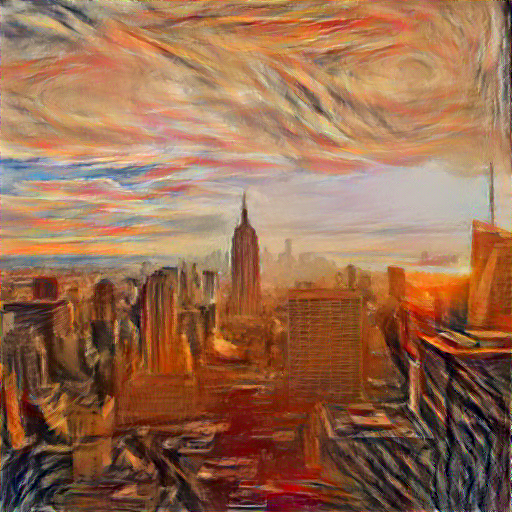

In [49]:
input_image = content_image[1].clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output_lbfgs_content_input, metrics_lbfgs_content_input = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime_lbfgs_content_input = time_end - time_start
print("Total Runtime (Seconds): ", runtime_lbfgs_content_input)

if torch.cuda.is_available():
    peak_memory_lbfgs_content_input = torch.cuda.max_memory_allocated()
    peak_memory_lbfgs_content_input = peak_memory_lbfgs_content_input/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory_lbfgs_content_input)

display_image(output_lbfgs_content_input)

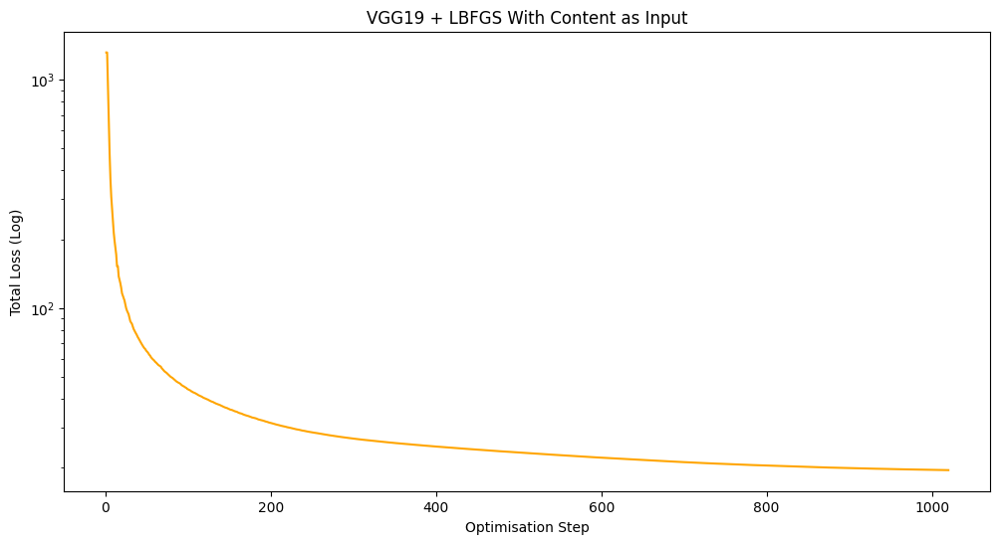

In [53]:
plt.figure(figsize=(12, 6))

plt.plot(metrics_lbfgs_content_input["step"], metrics_lbfgs_content_input["total"], label="Total Loss", color="orange")
plt.yscale("log")
plt.xlabel("Optimisation Step")
plt.ylabel("Total Loss (Log)")
plt.title("VGG19 + LBFGS With Content as Input")
plt.show()

### Adam

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 70.200539 Content Loss: 28.577091

run [200]:
Style Loss : 48.956146 Content Loss: 25.418055

run [300]:
Style Loss : 40.373817 Content Loss: 23.628271

run [400]:
Style Loss : 35.167446 Content Loss: 22.441753

run [500]:
Style Loss : 31.492544 Content Loss: 21.568424

run [600]:
Style Loss : 28.690681 Content Loss: 20.898838

run [700]:
Style Loss : 26.443810 Content Loss: 20.361378

run [800]:
Style Loss : 24.606773 Content Loss: 19.915545

run [900]:
Style Loss : 23.051313 Content Loss: 19.540794

run [1000]:
Style Loss : 21.710827 Content Loss: 19.216665

Total Runtime (Seconds):  82.53502011299133
Maximum Memory (GB):  1.00732421875


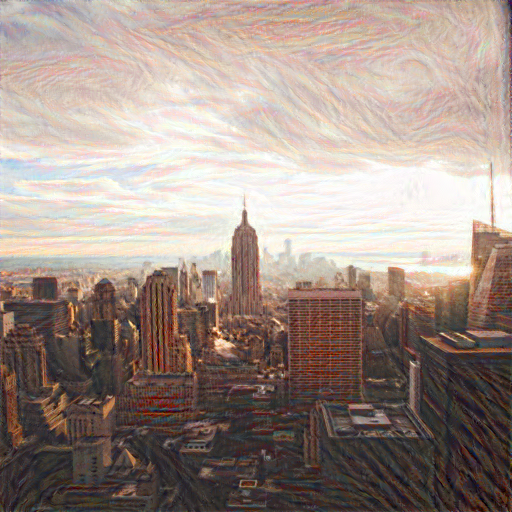

In [61]:
input_image = content_image[1].clone().detach()
cnn, content_layers, style_layers = vgg_model("vgg19")

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output_adam_content_input, metrics_adam_content_input = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="adam")

time_end = time.time()
runtime_adam_content_input = time_end - time_start
print("Total Runtime (Seconds): ", runtime_adam_content_input)

if torch.cuda.is_available():
    peak_memory_adam_content_input = torch.cuda.max_memory_allocated()
    peak_memory_adam_content_input = peak_memory_adam_content_input/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory_adam_content_input)

display_image(output_adam_content_input)

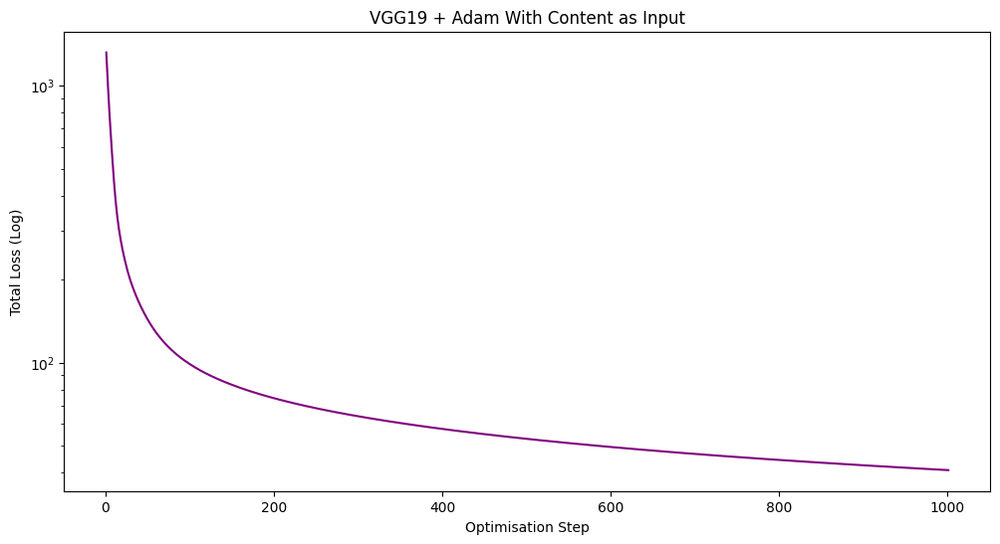

In [63]:
plt.figure(figsize=(12, 6))

plt.plot(metrics_adam_content_input["step"], metrics_adam_content_input["total"], label="Total Loss", color="purple")
plt.yscale("log")
plt.xlabel("Optimisation Step")
plt.ylabel("Total Loss (Log)")
plt.title("VGG19 + Adam With Content as Input")
plt.show()

## Changing the Content Layer

### Third Block Second Layer

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 30.367458 Content Loss: 34.125328

run [200]:
Style Loss : 13.944645 Content Loss: 24.460922

run [300]:
Style Loss : 8.106872 Content Loss: 20.237675

run [400]:
Style Loss : 6.101976 Content Loss: 17.939976

run [500]:
Style Loss : 5.312101 Content Loss: 16.586777

run [600]:
Style Loss : 4.886099 Content Loss: 15.734960

run [700]:
Style Loss : 4.608795 Content Loss: 15.136132

run [800]:
Style Loss : 4.406673 Content Loss: 14.710468

run [900]:
Style Loss : 4.258446 Content Loss: 14.389313

run [1000]:
Style Loss : 4.145786 Content Loss: 14.138674

Total Runtime (Seconds):  114.7601261138916
Maximum Memory (GB):  1.3466663360595703


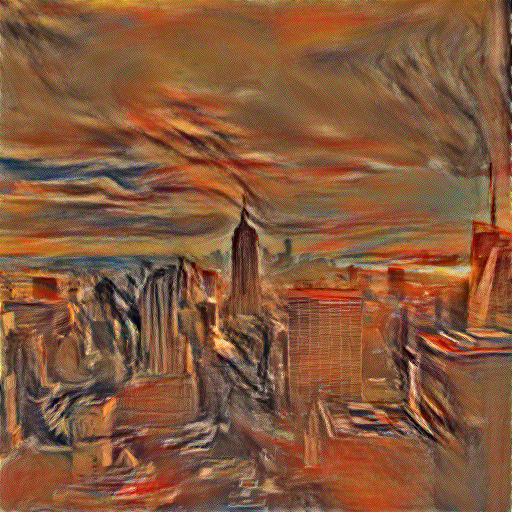

In [72]:
input_image = white_noise.clone().detach()
cnn, _, style_layers = vgg_model("vgg19")
content_layers = ["conv_6"]

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)

### Fifth Block Second Layer

Building the style transfer model..
Optimizing..
run [100]:
Style Loss : 25.593481 Content Loss: 9.016769

run [200]:
Style Loss : 9.325977 Content Loss: 5.965724

run [300]:
Style Loss : 4.634363 Content Loss: 4.759898

run [400]:
Style Loss : 3.305766 Content Loss: 4.136112

run [500]:
Style Loss : 2.763114 Content Loss: 3.771035

run [600]:
Style Loss : 2.470069 Content Loss: 3.533363

run [700]:
Style Loss : 2.287571 Content Loss: 3.366262

run [800]:
Style Loss : 2.161235 Content Loss: 3.248128

run [900]:
Style Loss : 2.066721 Content Loss: 3.160687

run [1000]:
Style Loss : 1.995999 Content Loss: 3.095098

Total Runtime (Seconds):  114.31172251701355
Maximum Memory (GB):  1.272325038909912


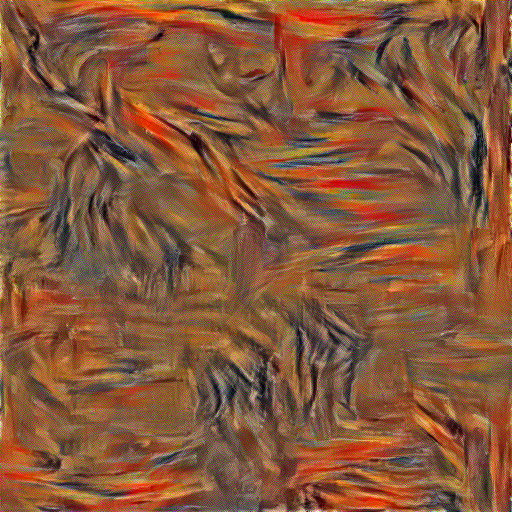

In [73]:
input_image = white_noise.clone().detach()
cnn, _, style_layers = vgg_model("vgg19")
content_layers = ["conv_14"]

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()

time_start = time.time()
output, metrics = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_image[1], style_image[1], input_image, content_layers, style_layers, 
                       num_steps=1000, style_weight=100000, content_weight=1, optimizer_name="lbfgs")

time_end = time.time()
runtime = time_end - time_start
print("Total Runtime (Seconds): ", runtime)

if torch.cuda.is_available():
    peak_memory = torch.cuda.max_memory_allocated()
    peak_memory = peak_memory/(1024 ** 3)
    print("Maximum Memory (GB): ", peak_memory)


display_image(output)